## Exploratory data analysis

### Setup

In [1]:
%%capture
%pip install -r ../requirements.txt

In [2]:
import os
import numpy as np
import pandas as pd
from pathlib import Path
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import OrdinalEncoder, MinMaxScaler
from IPython.display import Image
from scipy.stats import zscore
from scipy import stats

import tqdm # DO NOT REMOVE

%matplotlib inline

In [3]:
PROJECT_PATH = Path.joinpath(Path.cwd(), '..')
DATA_PATH = PROJECT_PATH / "data"
CSV_PATH = DATA_PATH / "gym_members_exercise_tracking.csv"

In [4]:
df = pd.read_csv(CSV_PATH)

### Automatic EDA

We have used the *pandas-profiling* library to generate a report for the dataset, where we can find useful data for doing the univariate, bivariate and correlation analysis.

For the **univariate analysis** we have quantile statistics (min, 5th percentile, Q1, median, Q3, 95th percentile, max, range, IQR), descriptive statistics (standard deviation, CV, kurtosis, mean, MAD, skewness, sum, variance, monotonicity) and a plot (histogram, bar chart) for each feature.

For the **bivariate analysis** we have a scatter plot for each pair of features.

For the **correlation analysis** we have a correlation matrix and a heatmap.

Moreover, general information about the dataset is provided, such as the number of missing values, unique values, duplicated rows, numerical and categorical features, etc.

Last but not least, there are alerts for high correlated features and other issues that need to be addressed.

We provide the report for reference. We strongly recommend to take a look at it.

In [5]:
from ydata_profiling import ProfileReport

PROFILE_PATH = DATA_PATH / "profiling_report.pp"

if not PROFILE_PATH.exists():
    print("Generating profiling report...")
    profile = ProfileReport(df, title="Profiling Report")
    profile.dump(PROFILE_PATH)
    profile.to_file("profiling_report.html")

In [6]:
import webbrowser

absolute_path = Path.cwd() / "profiling_report.html"
webbrowser.open(absolute_path.as_uri())
print(absolute_path.as_uri())

file:///mnt/40EE82D1EE82BF22/Users/jordi/Documents/GitHub/meinf-ai-wp-01/notebooks/profiling_report.html


### Data overview

We have 973 observations and 15 features, which is a healthy ratio for most machine learning models. Anyway, removing some correlated features could be beneficial. If the data is of good quality, we can expect good results.

In [7]:
df.shape

(973, 15)

The data types are not optimal. The `Gender`, `Workout_Type`, `Experience_Level` and `Workout_Frequency (days/week)` columns should be categorical.

The numerical types could be downcasted but we are not going to do it because we will normalize them later on.

In [8]:
df.dtypes

Age                                int64
Gender                            object
Weight (kg)                      float64
Height (m)                       float64
Max_BPM                            int64
Avg_BPM                            int64
Resting_BPM                        int64
Session_Duration (hours)         float64
Calories_Burned                  float64
Workout_Type                      object
Fat_Percentage                   float64
Water_Intake (liters)            float64
Workout_Frequency (days/week)      int64
Experience_Level                   int64
BMI                              float64
dtype: object

Correcting the data types will help us to save memory and make the code more readable.

In [9]:
df_casted = df.astype(copy=True, dtype={
    'Workout_Frequency (days/week)': 'category',
    'Experience_Level': 'category',
    'Workout_Type': 'category',
    'Gender': 'category'
})
df_casted.dtypes

Age                                 int64
Gender                           category
Weight (kg)                       float64
Height (m)                        float64
Max_BPM                             int64
Avg_BPM                             int64
Resting_BPM                         int64
Session_Duration (hours)          float64
Calories_Burned                   float64
Workout_Type                     category
Fat_Percentage                    float64
Water_Intake (liters)             float64
Workout_Frequency (days/week)    category
Experience_Level                 category
BMI                               float64
dtype: object

The domain (minimum and maximum values) and the average values of the different numerical features seems to be reasonable.

In [10]:
df_casted.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,973.0,38.683453,12.180928,18.00,28.00,40.00,49.00,59.00
Weight (kg),973.0,73.854676,21.207500,40.00,58.10,70.00,86.00,129.90
Height (m),973.0,1.722580,0.127720,1.50,1.62,1.71,1.80,2.00
Max_BPM,973.0,179.883864,11.525686,160.00,170.00,180.00,190.00,199.00
Avg_BPM,973.0,143.766701,14.345101,120.00,131.00,143.00,156.00,169.00
Resting_BPM,973.0,62.223022,7.327060,50.00,56.00,62.00,68.00,74.00
Session_Duration (hours),973.0,1.256423,0.343033,0.50,1.04,1.26,1.46,2.00
Calories_Burned,973.0,905.422405,272.641516,303.00,720.00,893.00,1076.00,1783.00
Fat_Percentage,973.0,24.976773,6.259419,10.00,21.30,26.20,29.30,35.00
Water_Intake (liters),973.0,2.626619,0.600172,1.50,2.20,2.60,3.10,3.70


The values of the categorical features are also reasonable.

In [11]:
categorical_df = df_casted.select_dtypes(include=['category'])
categories_values = {col: sorted(df_casted[col].value_counts().index.to_list()) for col in categorical_df.columns}
for col, values in categories_values.items():
    print(f"{col}: {values}")

Gender: ['Female', 'Male']
Workout_Type: ['Cardio', 'HIIT', 'Strength', 'Yoga']
Workout_Frequency (days/week): [2, 3, 4, 5]
Experience_Level: [1, 2, 3]


There are no duplicated rows.

In [12]:
df.duplicated().sum()

0

There are no missing values.

In [13]:
df.isnull().sum()

Age                              0
Gender                           0
Weight (kg)                      0
Height (m)                       0
Max_BPM                          0
Avg_BPM                          0
Resting_BPM                      0
Session_Duration (hours)         0
Calories_Burned                  0
Workout_Type                     0
Fat_Percentage                   0
Water_Intake (liters)            0
Workout_Frequency (days/week)    0
Experience_Level                 0
BMI                              0
dtype: int64

### Univariate analysis

#### Kurtosis

Kurtosis measures the tailedness of a distribution. High kurtosis signals the presence of heavy tails and extreme values, which can undermine statistical validity, distort model results, and misrepresent risks. Its values can be interpreted as follows:
1. Low Kurtosis (Platykurtic):
    - Range: $\text{kurtosis} \lt 3$
    - Light tails, fewer extreme outliers. The distribution is flatter and more uniform compared to a normal distribution.

2. Normal Kurtosis (Mesokurtic):
    - Range: $\text{kurtosis} \approx 3$
    - Moderate tails, typical of a normal distribution.

3. High Kurtosis (Leptokurtic)
    - Range: $\text{kurtosis} \gt 3$
    - Heavy tails, frequent extreme outliers. The distribution is more peaked in the center and has thicker tails.

We don't have any feature with high kurtosis (the maximum value is 0.74).

In [63]:
kurtosis_df = (
    df.select_dtypes(include=np.number)
    .kurtosis()
    .sort_values(ascending=False)
    .reset_index(name="Kurtosis")
    .rename(columns={"index": "Columns"})
    .set_index("Columns")
)
kurtosis_df


,Kurtosis
Columns,
BMI,0.743240
Weight (kg),-0.023969
Calories_Burned,-0.056050
Fat_Percentage,-0.339019
Session_Duration (hours),-0.350805
Height (m),-0.723633
Workout_Frequency (days/week),-0.806101
Water_Intake (liters),-1.020298
Experience_Level,-1.123111


#### Skewness

Skewness quantifies the asymmetry of a distribution. Skewed data can affect statistical methods that assume normality, so we need to be aware of it. Its values can be interpreted as follows:

1. Symmetric Distribution (Approx. Zero):
    - Range: $-0.5 \leq \text{skewness} \leq 0.5$
    - The distribution is roughly symmetric, like a normal distribution.

2. Moderate Skewness:
    - Range: $0.5 < |\text{skewness}| \leq 1.0$
    - The distribution has a noticeable skew but is not extremely asymmetrical.

3. High Skewness:
    - Range: $|\text{skewness}| > 1.0$
    - The distribution is heavily skewed, indicating a pronounced asymmetry.

We don't have any feature with high skewness (the maximum value is 0.77).

In [65]:
skewness_df = (
    df.select_dtypes(include=np.number)
    .skew()
    .sort_values(ascending=False)
    .reset_index(name="Skewness")
    .rename(columns={"index": "Columns"})
    .set_index("Columns")
)
skewness_df


,Skewness
Columns,
Weight (kg),0.772384
BMI,0.763648
Height (m),0.338858
Experience_Level,0.318513
Calories_Burned,0.278321
Workout_Frequency (days/week),0.149815
Avg_BPM,0.086361
Water_Intake (liters),0.071480
Session_Duration (hours),0.025761


#### Common values

`Water_Intake (liters)` has two peaks on 2.7 and 3.5 liters, which is strange. We will keep an eye on this feature.

In [16]:
# Common `Water_Intake (liters)` values
water_intake_counts = df['Water_Intake (liters)'].value_counts()
water_intake_percentage = (water_intake_counts / len(df)) * 100

pd.DataFrame({
    'Count': water_intake_counts,
    'Percentage': water_intake_percentage
}).head()

,Count,Percentage
Water_Intake (liters),,
3.5,124,12.744090
2.7,123,12.641316
2.3,59,6.063720
2.1,57,5.858171
2.4,55,5.652621


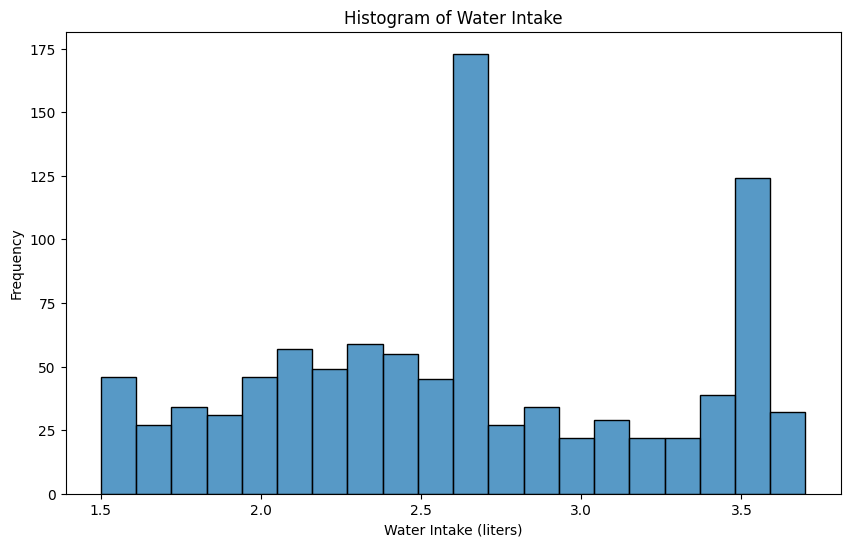

In [70]:
# Histogram of Water Intake
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x="Water_Intake (liters)", bins=20)
plt.title("Histogram of Water Intake")
plt.xlabel("Water Intake (liters)")
plt.ylabel("Frequency")
plt.show()

#### Outliers

##### Visualizations

Using some boxplots, we can see that there are outliers in the `Weight (kg)`, `Calories_Burned` and `BMI` features. We will keep it in mind. 

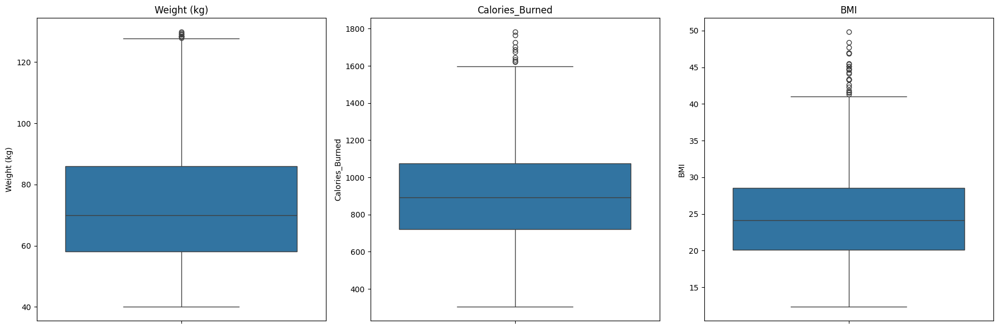

In [19]:
selected_columns = "Weight (kg)", "Calories_Burned", "BMI"

fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for ax, column in zip(axes, selected_columns):
    sns.boxplot(data=df, y=column, ax=ax)
    ax.set_title(column)

# Adjust layout for better appearance
plt.tight_layout()
plt.show()

##### Z-score

The Z-score is a statistical measurement that describes a value's relationship to the mean of a group of values. It is a measure of how many standard deviations an element is from the mean.

<img src="images/SND.webp" alt="Standard Normal Distribution" style="width: 100%;max-width: 500px; height: auto;" />

Nearly 99.7% of the data falls within three standard deviations of the mean (z-scores between -3 and 3). So we will consider as outliers the values that have a z-score greater than 3 or less than -3.

In [20]:
df_numerical = df.select_dtypes(include=np.number)

# Calculate z-scores for all numerical columns
z_scores = df_numerical.apply(zscore)

# Find rows where any z-score is greater than 3 (outliers)
df_zscore_outliers =  df[(z_scores.abs() > 3).any(axis=1)]

df_zscore_outliers.__len__()

13

In [21]:
df_zscore_outliers

,Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
133,21,Male,125.2,1.66,196,159,60,1.38,1207.0,HIIT,29.8,3.4,3,2,45.43
251,33,Male,117.0,1.61,166,130,55,1.04,744.0,HIIT,25.1,2.4,3,2,45.14
261,57,Male,126.8,1.63,161,133,73,0.96,632.0,Yoga,20.8,2.1,2,1,47.72
291,55,Male,128.4,1.68,178,165,52,1.13,923.0,Cardio,20.4,2.6,4,2,45.49
470,34,Male,124.6,1.63,161,136,66,1.41,1055.0,HIIT,27.6,2.8,3,2,46.90
511,39,Male,86.2,1.82,191,160,72,1.96,1725.0,Strength,10.2,3.5,5,3,26.02
687,18,Male,125.9,1.67,172,153,60,1.46,1229.0,Yoga,20.6,2.2,3,2,45.14
710,38,Male,123.3,1.62,161,165,65,1.34,1216.0,Yoga,21.2,2.3,4,2,46.98
712,19,Male,82.4,1.96,174,169,62,1.90,1766.0,HIIT,10.1,3.5,5,3,21.45
854,48,Male,129.2,1.61,193,167,62,1.06,876.0,Yoga,21.4,2.9,4,2,49.84


We have found 13 outliers (1.33% of the dataset) using the z-score method. Most of them are mainly heavy-weighted people, with high BPM or with long session durations. They are all male.

##### IQR

The Interquartile Range (IQR) method is a good method for detecting outliers. We will use it to detect the outliers in the numerical features.
To identify outliers using the IQR method, we establish two boundaries:

- $Lower Bound = Q1 - 1.5 * IQR$
- $Upper Bound = Q3 + 1.5 * IQR$


In [22]:
df_numerical = df.select_dtypes(include=np.number)

# Calculate Q1 (25th percentile) and Q3 (75th percentile) for each numerical column
Q1 = df_numerical.quantile(0.25)
Q3 = df_numerical.quantile(0.75)

# Calculate IQR (Interquartile Range)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Determine outliers using the IQR score
df_iqr_outliers = df[((df_numerical < lower_bound) | (df_numerical > upper_bound)).any(axis=1)]

df_iqr_outliers.__len__()

41

In [23]:
df_iqr_outliers

,Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
10,41,Male,120.8,1.67,188,146,54,0.82,593.0,HIIT,20.5,3.0,2,1,43.31
12,57,Male,112.5,1.61,195,165,61,1.24,1013.0,Cardio,22.1,2.7,3,2,43.40
35,26,Male,127.6,1.73,167,160,62,1.32,1162.0,Strength,27.3,2.9,3,1,42.63
55,23,Male,114.8,1.60,182,163,60,1.47,1318.0,Cardio,21.7,2.7,4,2,44.84
90,25,Male,81.5,1.61,170,159,63,1.93,1688.0,HIIT,10.9,3.5,4,3,31.44
96,56,Male,129.0,1.78,194,126,64,1.29,805.0,Yoga,27.1,2.7,2,1,40.71
99,24,Female,60.1,1.79,170,165,63,1.97,1625.0,Cardio,15.9,2.7,4,3,18.76
122,56,Male,129.5,1.95,160,129,66,1.00,639.0,Strength,25.2,3.5,2,1,34.06
124,26,Male,86.2,1.68,189,157,72,1.97,1701.0,Strength,13.3,3.5,5,3,30.54
133,21,Male,125.2,1.66,196,159,60,1.38,1207.0,HIIT,29.8,3.4,3,2,45.43


We have found 41 outliers (4.2% of the dataset) using the IQR method. Most of them are male, heavy-weighted people with an high BMI. There are also some people who have burned a lot of calories or have a high water intake.

### Bivariate analysis

##### Pairwise relationships plot

Using a pairplot we can have a quick overview of the distribution of the features and the relationships between them.

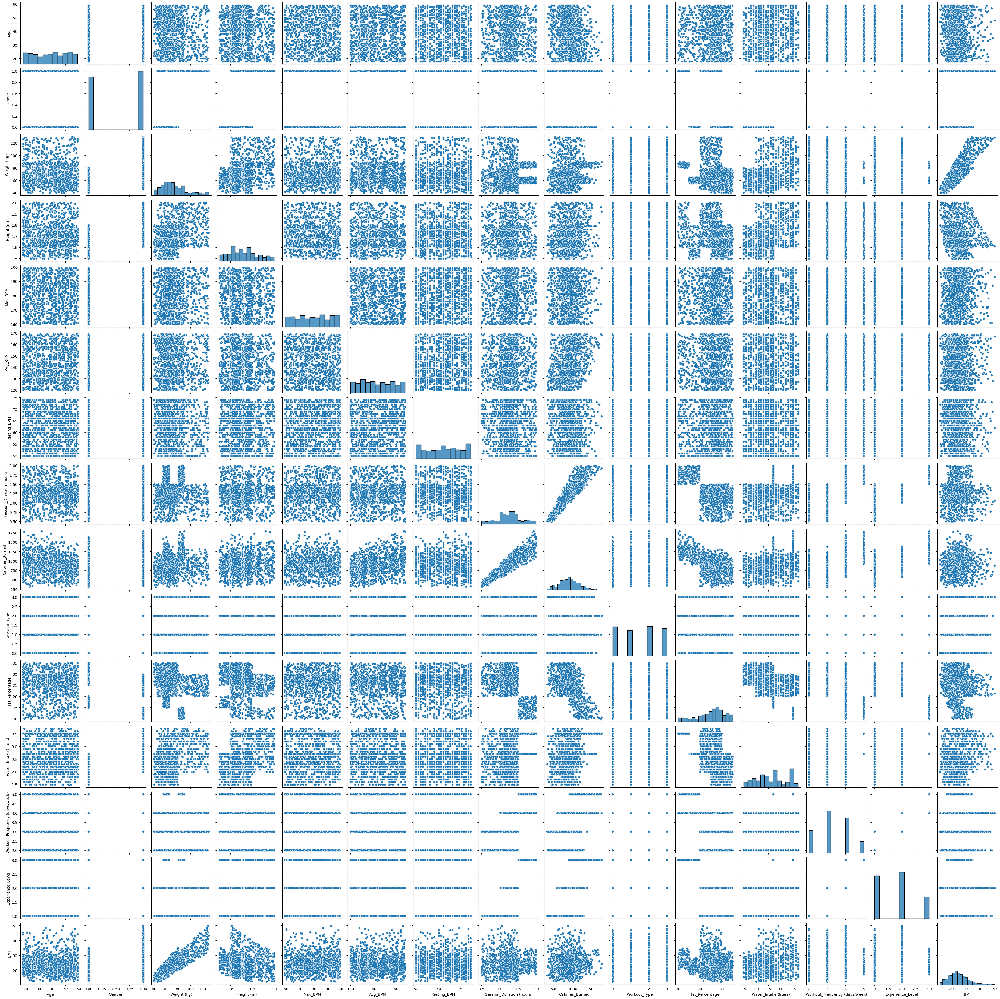

In [72]:
if not os.path.exists("images/pairplot.png"):
    sns_plot = sns.pairplot(df_casted)
    sns_plot.savefig("images/pairplot.png")
    plt.clf() 

Image(filename='images/pairplot.png')

We can see that there are some strange patterns. One problematic feature is the `Fat_Percentage`, which presents some subgroups in its distributions with other features. It could be a subgroup of people or an error in the generation of the data (because it is a synthetic dataset).

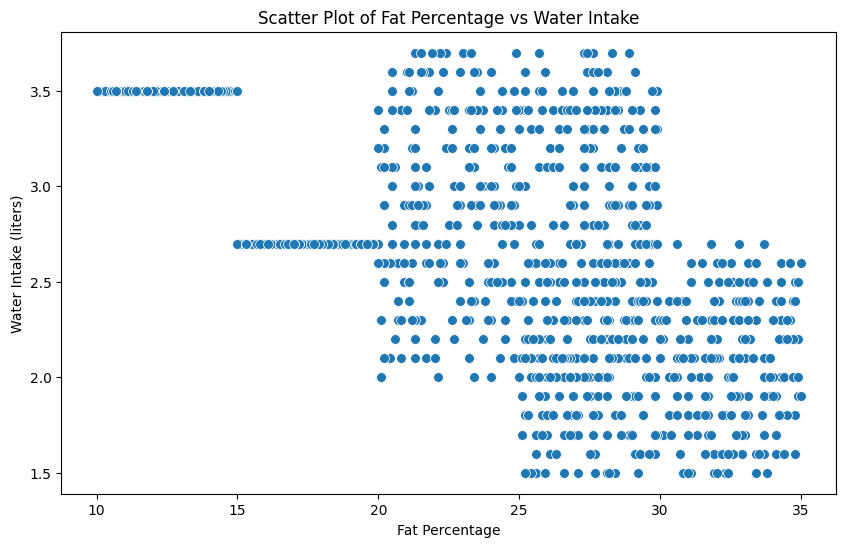

In [25]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Fat_Percentage", y="Water_Intake (liters)", s=50)
plt.title("Scatter Plot of Fat Percentage vs Water Intake")
plt.xlabel("Fat Percentage")
plt.ylabel("Water Intake (liters)")
plt.show()

Another feature that presents some strange distributions is the `Weight (kg)`.

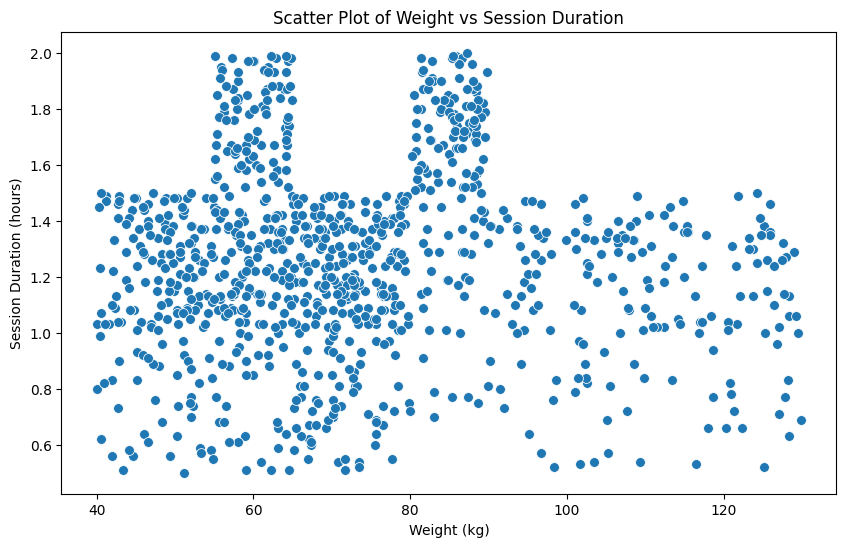

In [26]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Weight (kg)", y="Session_Duration (hours)", s=50)
plt.title("Scatter Plot of Weight vs Session Duration")
plt.xlabel("Weight (kg)")
plt.ylabel("Session Duration (hours)")
plt.show()

Is we combine the `Fat_Percentage` and `Weight (kg)` features, we can see even more clearly the subgroups in the `Fat_Percentage` feature.

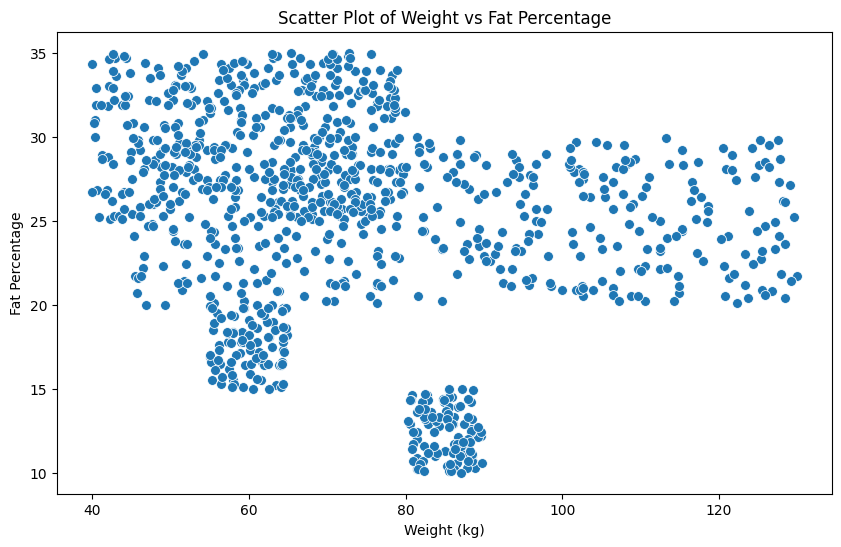

In [27]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Weight (kg)", y="Fat_Percentage", s=50)
plt.title("Scatter Plot of Weight vs Fat Percentage")
plt.xlabel("Weight (kg)")
plt.ylabel("Fat Percentage")
plt.show()

After some analysis, we have found that these patterns appear because there are two gaps on the `Fat_Percentage` feature, one between 21-24% for women and another between 10-16% for men. It doesn't make sense to have a gap with the number of samples we have, so something is wrong with the data.

References:
-  [A Study on Body Fat Percentage for Physical Fitness and Prevention of Obesity: A Two Compartment Model](https://mpra.ub.uni-muenchen.de/117158/1/Body%20Fat%20Per-27-4-23%20MPRA.pdf)

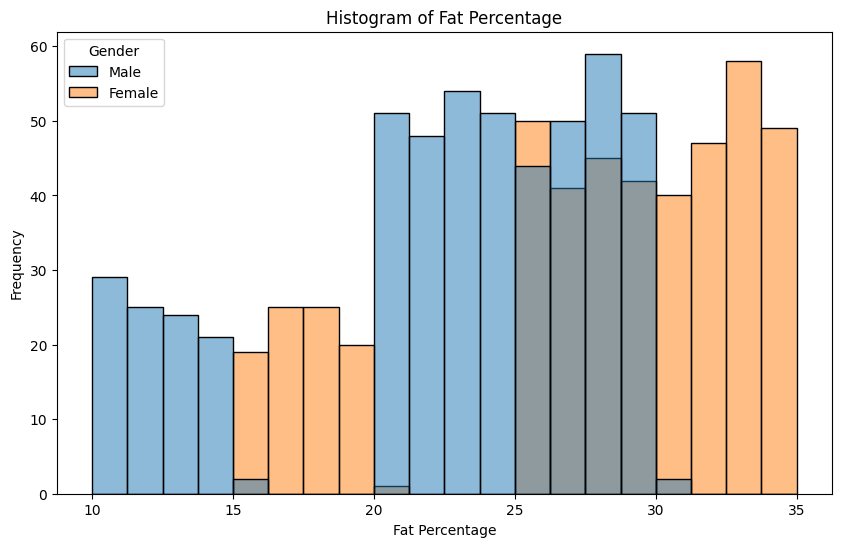

In [ ]:
#  Histogram of Fat Percentage
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x="Fat_Percentage", bins=20, hue="Gender")
plt.title("Histogram of Fat Percentage")
plt.xlabel("Fat Percentage")
plt.ylabel("Frequency")
plt.show()

#### Bimodal distribution

It seems that the `Gender` feature has a strong influence in the distribution of the dataset. It affects features like `Fat_Percentage`, `Weight (kg)` and `BMI`.

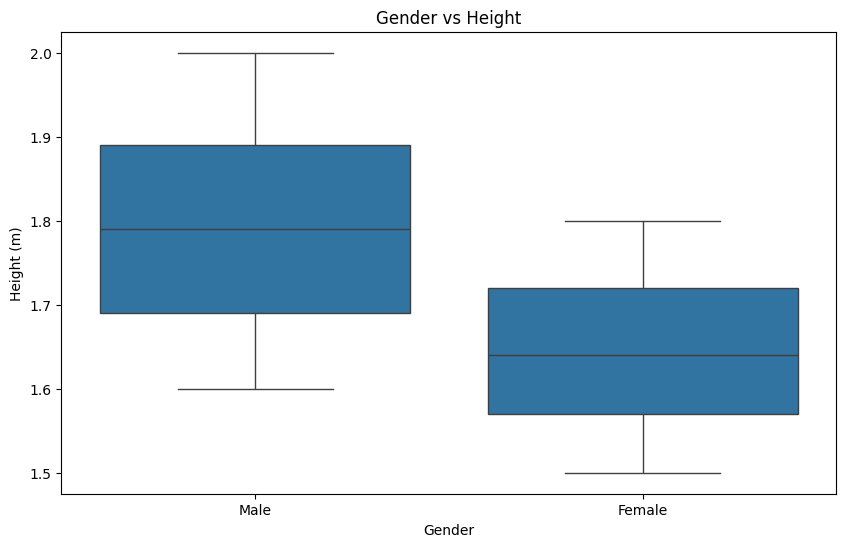

In [77]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="Gender", y="Height (m)")
plt.title("Gender vs Height")
plt.xlabel("Gender")
plt.ylabel("Height (m)")
plt.show()

For example, with the univariate analysis we couldn't find any outlier for `Fat_Percentage`. But if we plot the data by `Gender`, we can see that there are indeed some outliers.

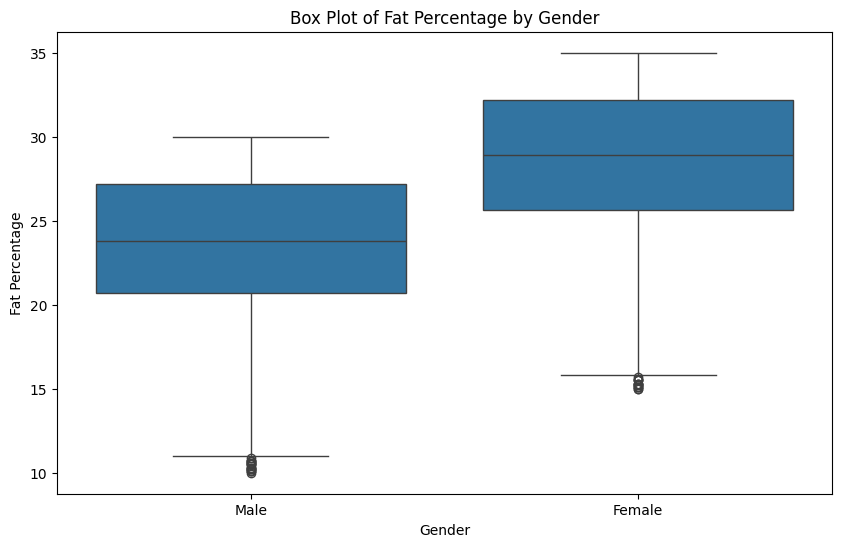

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x="Gender", y="Fat_Percentage")
plt.title("Box Plot of Fat Percentage by Gender")
plt.xlabel("Gender")
plt.ylabel("Fat Percentage")
plt.show()

We will investigate this further in the multivariate analysis.

### Multivariate analysis

If we make a pairplot with the `Gender` feature as the hue, we can see the strong influence of this feature in the dataset. It also explains the strange patters we have seen before.

We could consider creating two models (one per gender) if the results are not good enough.

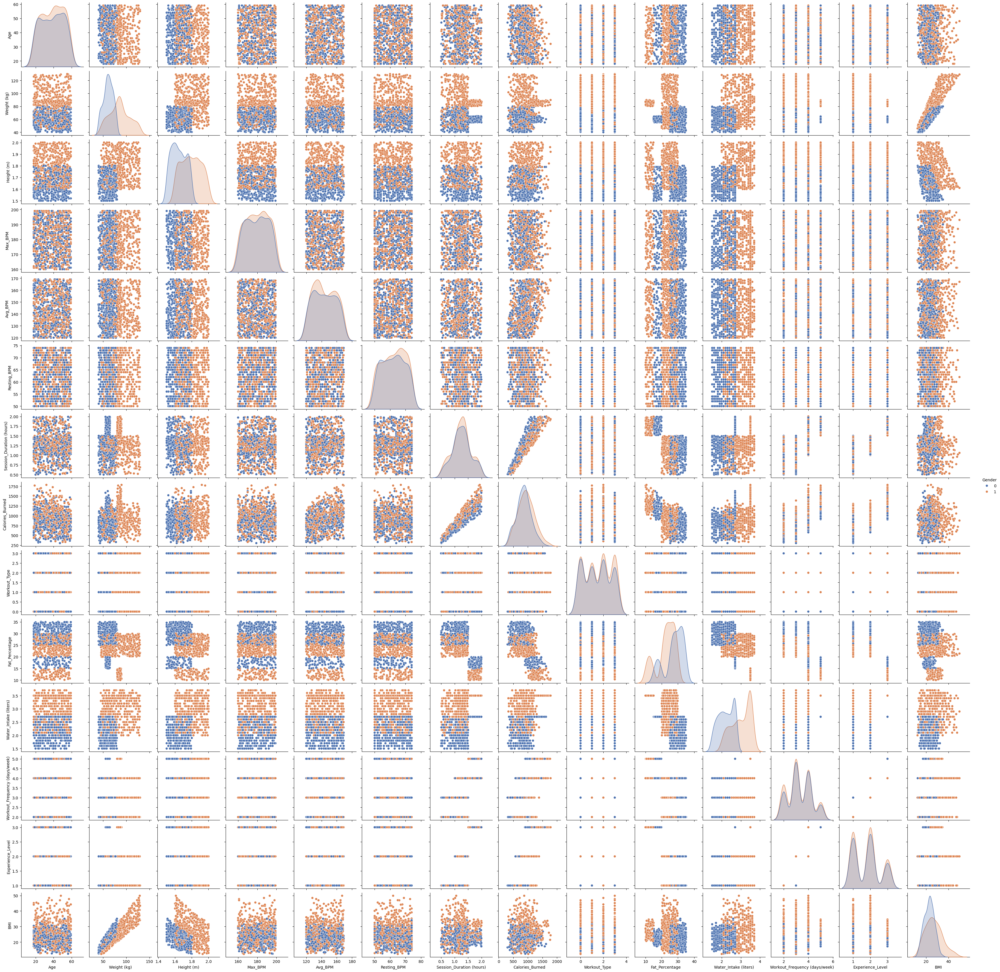

In [74]:
if not os.path.exists("images/pairplot-gender.png"):
    sns_plot = sns.pairplot(df_casted, hue='Gender', palette='deep')
    sns_plot.savefig("images/pairplot-gender.png")
    plt.clf() 

Image(filename='images/pairplot-gender.png')

People with more `Experience_Level` tend to have higher `Session_Duration (hours)` .

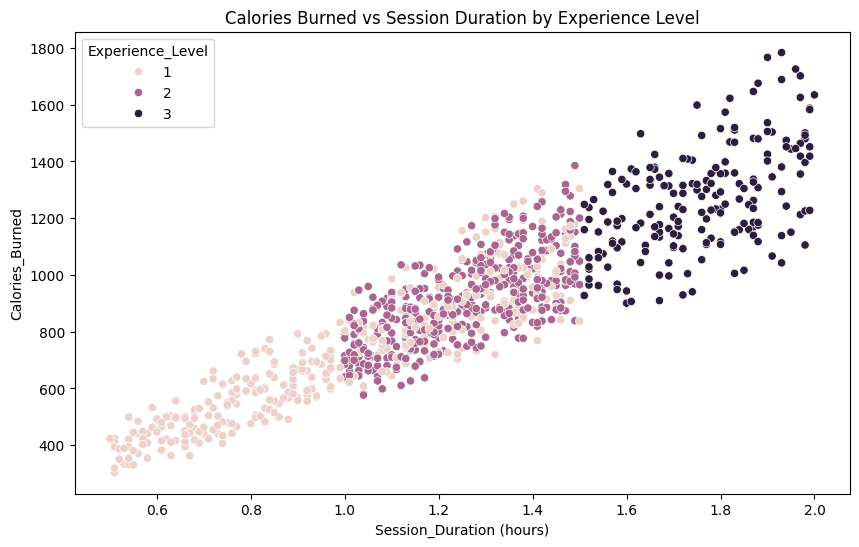

In [31]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Session_Duration (hours)', y='Calories_Burned', hue='Experience_Level', data=df)
plt.title('Calories Burned vs Session Duration by Experience Level')
plt.show()

People that do more `Workout_Frequency (days/week)` tend to have higher `Session_Duration (hours)`.

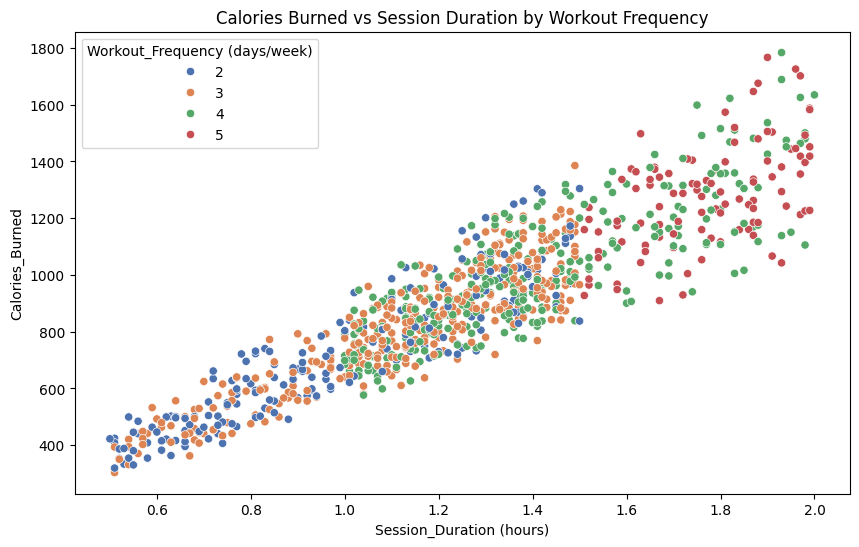

In [82]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Session_Duration (hours)', y='Calories_Burned', hue='Workout_Frequency (days/week)', data=df, palette="deep")
plt.title('Calories Burned vs Session Duration by Workout Frequency')
plt.show()

### Correlation analysis

We need to convert the categorical features to numerical, so we can calculate the correlation matrix.

In [32]:
encoder = OrdinalEncoder()
encoded_df = pd.DataFrame(encoder.fit_transform(df), columns=df.columns)

Moreover, the data needs to be normalized before performing the correlation analysis. This is because the features have different scales and the correlation matrix is sensitive to the scale of the data.

In [33]:
scaler = MinMaxScaler()
scaled_df = pd.DataFrame(scaler.fit_transform(encoded_df), columns=encoded_df.columns)

We used both the Pearson and Spearman correlation heatmaps to analyze the relationships between variables from two perspectives: Pearson correlation measures linear relationships, assuming normally distributed data, while Spearman correlation assesses monotonic relationships, making it robust to outliers and non-linear trends. By comparing the two, we ensured a comprehensive understanding of variable interactions, regardless of data distribution or outliers. The values from both heatmaps are very similar in this case because the relationships between the variables are predominantly linear and free of significant outliers, aligning well with both correlation methods.

#### Pearson correlation heatmap

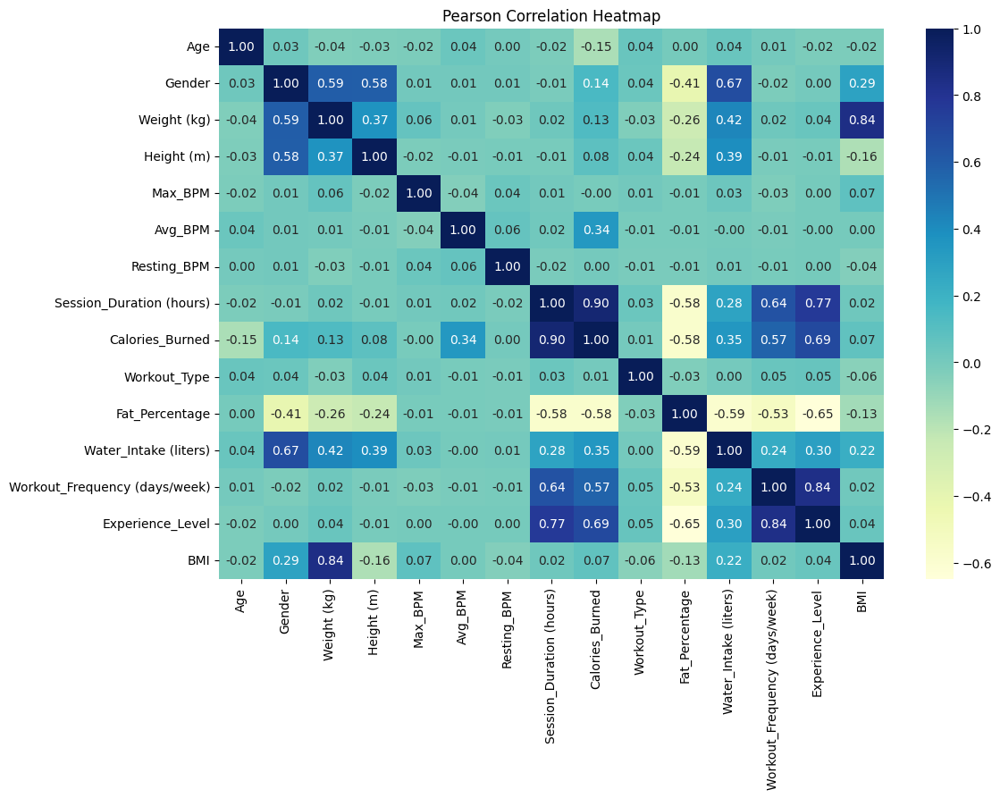

In [34]:
plt.figure(figsize=(12, 8))
sns.heatmap(scaled_df.corr(method="pearson"), cmap="YlGnBu", annot=True, fmt=".2f")

plt.title("Pearson Correlation Heatmap")
plt.show()

#### Spearman correlation heatmap

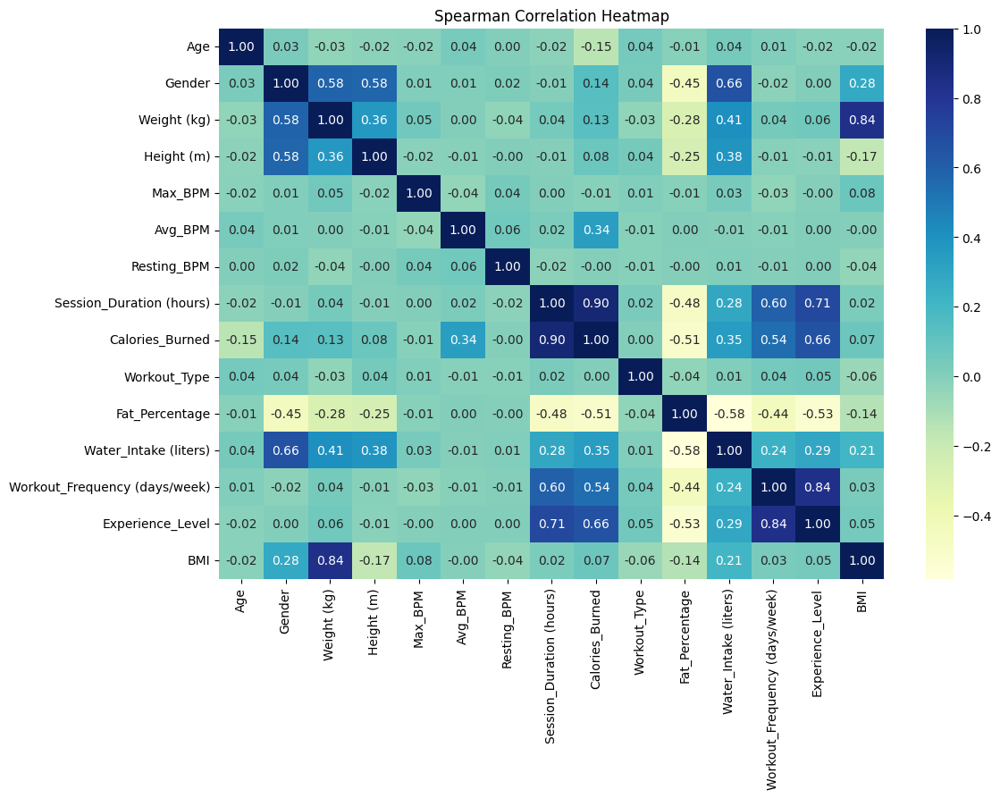

In [35]:
plt.figure(figsize=(12, 8))
sns.heatmap(scaled_df.corr(method="spearman"), cmap="YlGnBu", annot=True, fmt=".2f")

plt.title("Spearman Correlation Heatmap")
plt.show()

#### Findings

`Weight (kg)` and `BMI` are highly correlated. We could remove one of them.

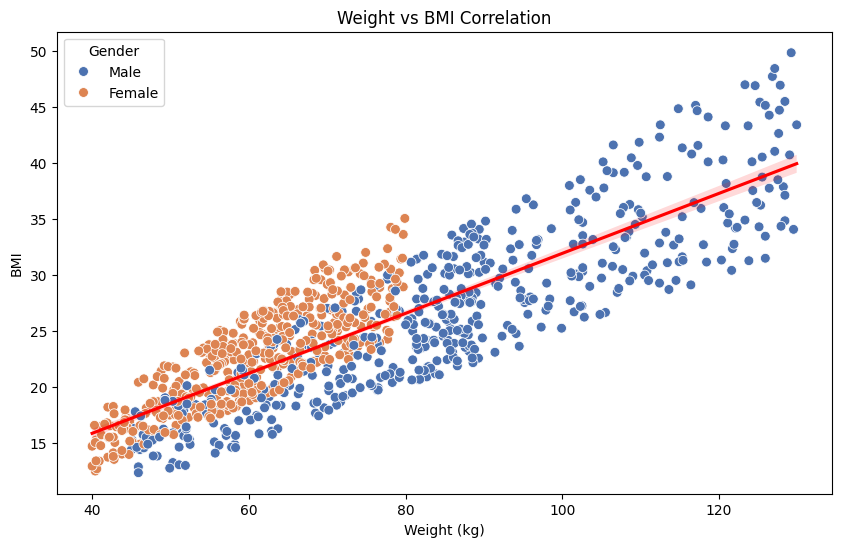

Correlation between Weight and BMI: 0.8531576898507092


In [36]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Weight (kg)", y="BMI", hue="Gender", palette="deep", s=50)
sns.regplot(data=df, x="Weight (kg)", y="BMI", scatter=False, line_kws={"color":"red"})
plt.title("Weight vs BMI Correlation")
plt.xlabel("Weight (kg)")
plt.ylabel("BMI")
plt.show()

correlation = df["Weight (kg)"].corr(df["BMI"])
print(f"Correlation between Weight and BMI: {correlation}")

`Session_Duration (hours)` and `Calories_Burned` are highly correlated. So `Session_Duration (hours)` could be a good predictor for the `Calories_Burned` feature.

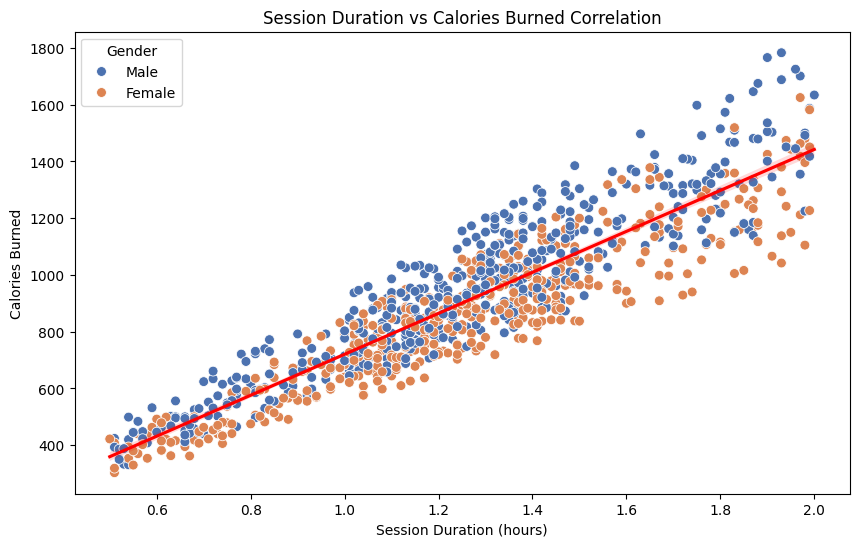

Correlation between Session Duration and Calories Burned: 0.9081403755270124


In [37]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="Session_Duration (hours)", y="Calories_Burned", hue="Gender", palette="deep", s=50)
sns.regplot(data=df, x="Session_Duration (hours)", y="Calories_Burned", scatter=False, line_kws={"color":"red"})
plt.title("Session Duration vs Calories Burned Correlation")
plt.xlabel("Session Duration (hours)")
plt.ylabel("Calories Burned")
plt.show()

correlation = df["Session_Duration (hours)"].corr(df["Calories_Burned"])
print(f"Correlation between Session Duration and Calories Burned: {correlation}")

`Experience_Level` and `Workout_Frequency (days/week)` are highly correlated. So we could remove one of them.

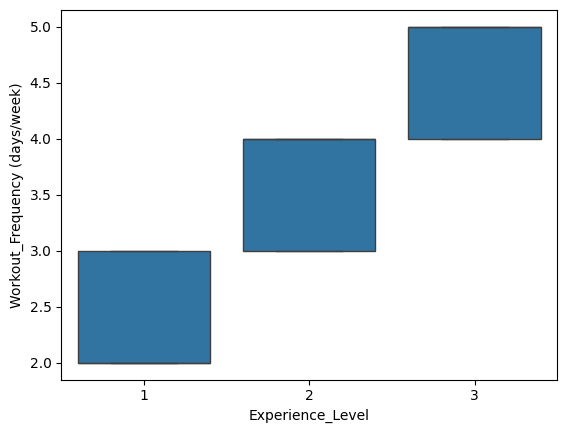

In [86]:
sns.boxplot(x='Experience_Level', y='Workout_Frequency (days/week)', data=df)
plt.show()


### Initial findings

#### Key Findings from EDA

1. **Data Quality**:
   - No missing values or duplicated rows.
   - Data types were corrected for categorical features.

2. **Univariate Analysis**:
   - No features with high kurtosis or skewness.
   - `Water_Intake (liters)` has two peaks, indicating potential issues.
   - Outliers detected in `Weight (kg)`, `Calories_Burned`, and `BMI`.
   - Using statistical methods (Z-score and IQR), we could remove some outliers (<5% of the dataset).

3. **Bivariate Analysis**:
   - `Fat_Percentage` by `Gender` reveals two gaps in the distribution, which could be an error on the data generation.
   - `Gender` has a strong influence on the distribution of several features.

4. **Multivariate Analysis**:
   - `Gender` significantly affects the dataset, suggesting potential for separate models by gender.
   - `Experience_Level` correlates with `Session_Duration (hours)`.
   - `Workout_Frequency (days/week)` correlates with `Session_Duration (hours)`.

5. **Correlation Analysis**:
   - High correlation between `Weight (kg)` and `BMI`.
   - High correlation between `Session_Duration (hours)` and `Calories_Burned`.
   - High correlation between `Experience_Level` and `Workout_Frequency (days/week)`.

#### Relation to Problem Statement and Objectives

- **Objective**: Predict `Calories_Burned` using other features.
  - **Finding**: `Session_Duration (hours)` is highly correlated with `Calories_Burned`, making it a strong predictor.
  - **Action**: Focus on `Session_Duration (hours)` as a key feature in the regression model.

- **Data Quality**:
  - **Finding**: Two peaks in `Water_Intake (liters)` distribution and two gaps in `Fat_Percentage` by `Gender`.
  - **Action**: Remove or replace the problematic data points to improve model performance.

- **Feature Engineering**:
  - **Finding**: High correlation between `Weight (kg)` and `BMI`, and between `Experience_Level` and `Workout_Frequency (days/week)`.
  - **Action**: Consider removing one feature from each pair to reduce multicollinearity.

- **Model Segmentation**:
  - **Finding**: `Gender` significantly influences the dataset.
  - **Action**: Consider creating separate models for each gender to improve prediction accuracy.

These findings guide the feature selection and model development process, ensuring a focused approach to achieving the objective of accurately predicting `Calories_Burned`.